# Install Detectron2 Dependencies

In [1]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8 MB 22 kB/s 
     |████████████████████████████████| 6.6 MB 37.9 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.12.1+cu113
    Uninstalling torch-1.12.1+cu113:
      Successfully uninstalled torch-1.12.1+cu113
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.13.1+cu113
    Uninstalling torchvision-0.13.1+cu113:
      Successfully uninstalled torchvision-0.13.1+cu113
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.13.1 requires torch==1.12.1, but you have torch 1.5.0+cu101 which is incompatible.
torchaudio 0.12.1+cu113 requires torch==1.12.1, but you have torch 1.5.0+cu101

In [2]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2 MB 524 kB/s 
     |████████████████████████████████| 50 kB 7.6 MB/s 
     |████████████████████████████████| 42 kB 920 kB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220512-py3-none-any.whl size=61288 sha256=541a31de6304ca14ad9deb33b44d6742d650ed9f924846bb81e01b0eae65cbd5
  Stored in directory: /root/.cache/pip/wheels/68/20/f9/a11a0dd63f4c13678b2a5ec488e48078756505c7777b75b29e
  Created wheel for iopath: filename=iopath-0.1.10-py3-none-any.whl size=31549 sha256=13d0cd2f39f6cf817610075fa87860e38150f9d7bef08c02d3d0260832ea0304
  Stored in directory: /root/.cache/pip/wheels/aa/cc/ed/ca4e88beef656b01c84b9185196513ef2faf74a5a379b043a7
Successfully built fvcore iopath


In [1]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

# Import and Register Custom Detectron2 Data

In [2]:
!curl -L "https://app.roboflow.com/ds/bpQdKdzgNH?key=wLCLX7g4mf" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   892  100   892    0     0    437      0  0:00:02  0:00:02 --:--:--   437
100 75.3M  100 75.3M    0     0  27.1M      0  0:00:02  0:00:02 --:--:--  103M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/20697_jpeg.rf.9929fd7364c385934d7780e1b7abcdec.jpg  
 extracting: test/20832_jpeg.rf.cb81da210ab86f6b70f4fd67f09420dc.jpg  
 extracting: test/20836_jpeg.rf.134cb65a41e22c9c828665a0f08a2227.jpg  
 extracting: test/20877_jpeg.rf.bc4305ca62a4e4370aac45689746b872.jpg  
 extracting: test/20888_jpeg.rf.175e015810f6cf61dc76dbf6d11b7978.jpg  
 extracting: test/20914_jpeg.rf.8da3962bd5ee07356ee1807e716dfe4b.jpg  
 extracting: test/20915_jpeg.rf.bd80568f0a5e2c1d9e13ad45a8aed221.jpg  
 extracting: test/20921_jpeg.rf.7fc3b9416fbec77dc4d824bbd134494f.jpg 

In [3]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")


WARNING [09/23 12:07:41 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/23 12:07:41 d2.data.datasets.coco]: Loaded 333 images in COCO format from /content/train/_annotations.coco.json


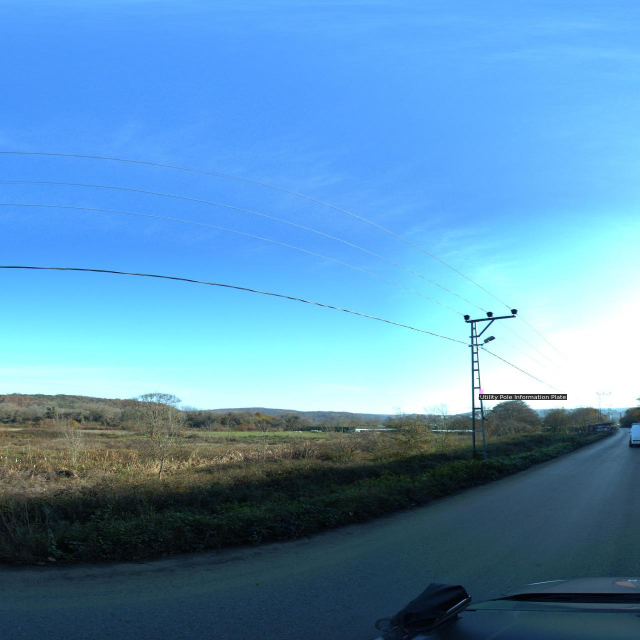

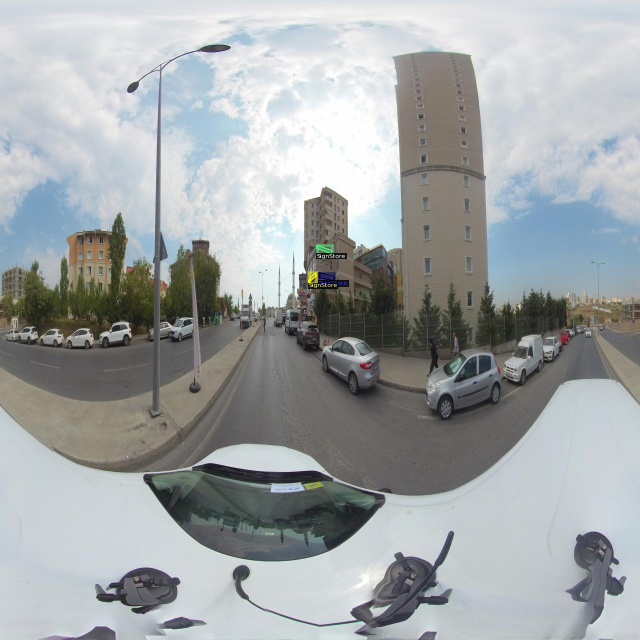

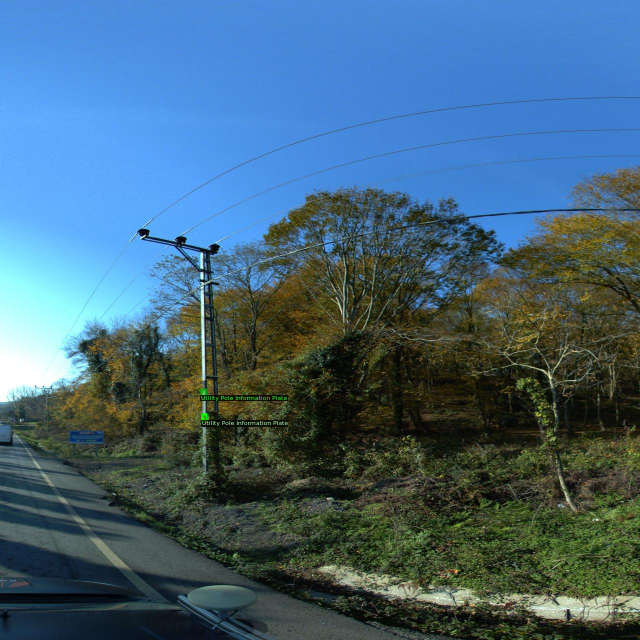

In [4]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Train Custom Detectron2 Detector

In [5]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [6]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 5000 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 5000)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[09/23 12:08:17 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_a3ec72.pkl: 254MB [05:50, 726kB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[09/23 12:14:11 d2.engine.train_loop]: Starting training from iteration 0
[09/23 12:14:29 d2.utils.events]:  eta: 1:14:52  iter: 19  total_loss: 2.919  loss_cls: 1.310  loss_box_reg: 0.063  loss_mask: 0.691  loss_rpn_cls: 0.573  loss_rpn_loc: 0.295  time: 0.8794  data_time: 0.0418  lr: 0.000020  max_mem: 4428M
[09/23 12:14:46 d2.utils.events]:  eta: 1:10:51  iter: 39  total_loss: 2.355  loss_cls: 0.958  loss_box_reg: 0.110  loss_mask: 0.676  loss_rpn_cls: 0.206  loss_rpn_loc: 0.280  time: 0.8635  data_time: 0.0100  lr: 0.000040  max_mem: 4428M
[09/23 12:15:04 d2.utils.events]:  eta: 1:11:55  iter: 59  total_loss: 1.779  loss_cls: 0.492  loss_box_reg: 0.130  loss_mask: 0.640  loss_rpn_cls: 0.176  loss_rpn_loc: 0.321  time: 0.8775  data_time: 0.0131  lr: 0.000060  max_mem: 4428M
[09/23 12:15:22 d2.utils.events]:  eta: 1:11:37  iter: 79  total_loss: 1.590  loss_cls: 0.386  loss_box_reg: 0.137  loss_mask: 0.604  loss_rpn_cls: 0.145  loss_rpn_loc: 0.318  time: 0.8789  data_time: 0.0108  lr:

In [7]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [8]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [09/23 13:42:02 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/23 13:42:02 d2.data.datasets.coco]: Loaded 68 images in COCO format from /content/test/_annotations.coco.json
[09/23 13:42:02 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |   category    | #instances   |
|:----------:|:-------------|:----------:|:-------------|:-------------:|:-------------|
|     g      | 0            | SignStore  | 145          | Utility Pol.. | 52           |
|            |              |            |              |               |              |
|   total    | 197          |            |              |               |              |
[09/23 13:42:03 d2.data.common]: Serializing 68 elements to byte tensors and concatenating them all ...
[09/23 13:42:03 d2.data.common]: Serialized dataset takes 0.05 MiB
[09/23 13:42:03 d2.evaluation.evaluator]: Start in

OrderedDict([('bbox',
              {'AP': 19.639152756684265,
               'AP50': 43.70245258105662,
               'AP75': 14.456491510106822,
               'APs': 16.585094515864416,
               'APm': 38.65724762339247,
               'APl': 36.791861603742795,
               'AP-g': nan,
               'AP-SignStore': 18.383813111867973,
               'AP-Utility Pole Information Plate': 20.894492401500553}),
             ('segm',
              {'AP': 19.252160188833734,
               'AP50': 43.147417910766144,
               'AP75': 15.268571346873808,
               'APs': 15.923826207055072,
               'APm': 38.20145664505024,
               'APl': 39.28623494217553,
               'AP-g': nan,
               'AP-SignStore': 17.32740579475128,
               'AP-Utility Pole Information Plate': 21.176914582916197})])

# Inference with Detectron2 Saved Weights



In [9]:
%ls ./output/

coco_instances_results.json                        metrics.json
events.out.tfevents.1663934901.10824696a3ba.266.0  model_0004999.pth
instances_predictions.pth                          model_final.pth
last_checkpoint


In [10]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

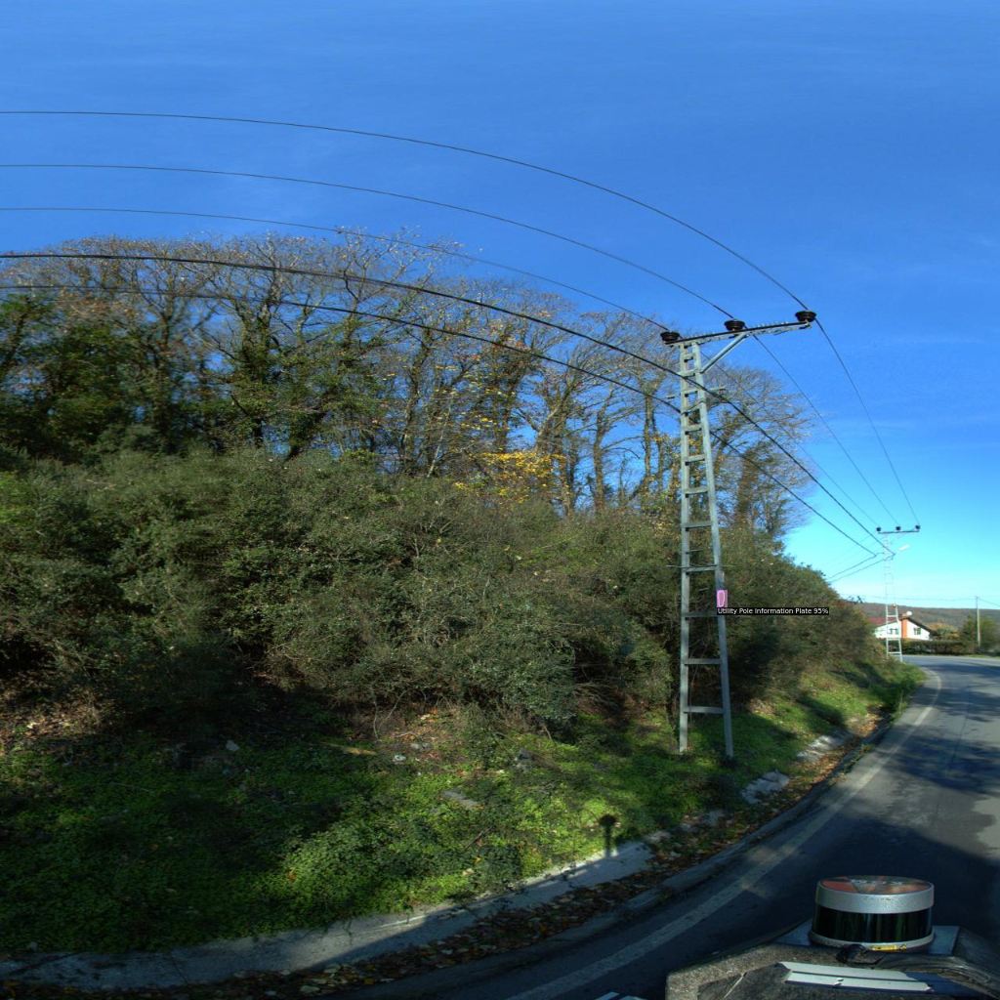

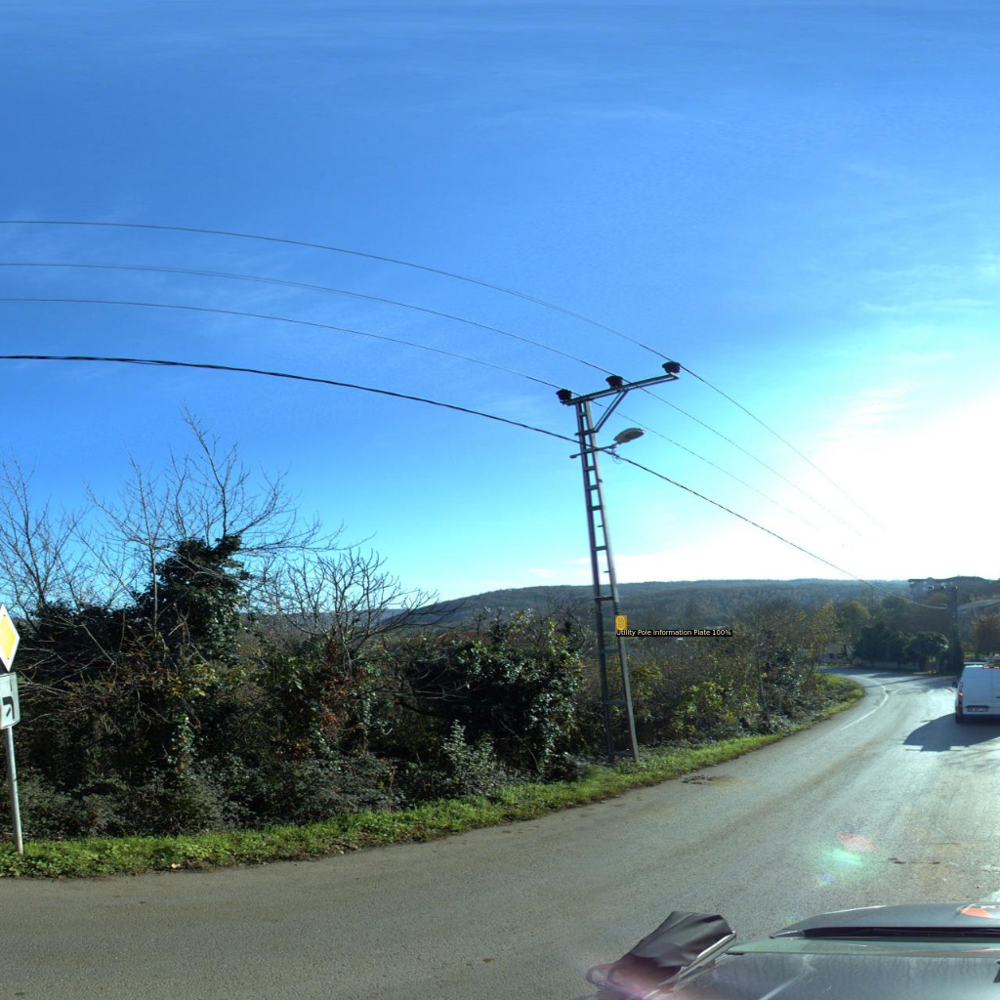

In [ ]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
